<a href="https://colab.research.google.com/github/Lakshmi-krishna-vr/TeamLuminous-ImageSharpeningUsingKnowledgeDistillation/blob/main/Team_Luminous_Image_sharpening_using_Knowledge_Distillation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install requests


[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import requests, zipfile, io
!pip install scikit-image -q

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import ToTensor, ToPILImage

import numpy as np
from PIL import Image, ImageFilter
import os
import glob
from tqdm import tqdm
import matplotlib.pyplot as plt
import time

from skimage.metrics import structural_similarity as ssim

# Setup device (GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")






[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Using device: cuda


In [ ]:
# Download and unzip the DIV2K dataset
url = "http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip"
print("📥 Downloading DIV2K HR images...")
r = requests.get(url)
z = zipfile.ZipFile(io.BytesIO(r.content))
z.extractall("DIV2K_train_HR")
print("✅ Dataset downloaded and extracted!")


In [ ]:
# --- Data Splitting ---
DATASET_PATH = 'DIV2K_train_HR/DIV2K_train_HR'
all_files = sorted(glob.glob(os.path.join(DATASET_PATH, "*.png")))

# Use 200 images for training and 100 for testing
train_files = all_files[:700]
test_files = all_files[700:800]
print(f"Found {len(train_files)} training images.")
print(f"Found {len(test_files)} testing images.")


Found 700 training images.
Found 100 testing images.


In [ ]:
class SharpeningDataset(Dataset):
    """Custom Dataset for creating blurry/sharp image pairs."""
    def __init__(self, image_paths, patch_size=256):
        self.image_paths = image_paths
        self.patch_size = patch_size
        self.to_tensor = ToTensor()
        self.scale_factor = 2

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        try:
            # Load the high-resolution (HR) ground truth image
            hr_image = Image.open(self.image_paths[idx]).convert('RGB')
            w, h = hr_image.size

            if w < self.patch_size or h < self.patch_size:
                hr_image = hr_image.resize((self.patch_size, self.patch_size), Image.BICUBIC)
                w, h = hr_image.size

            # Take a random crop for data augmentation
            rand_w = np.random.randint(0, w - self.patch_size + 1)
            rand_h = np.random.randint(0, h - self.patch_size + 1)
            hr_patch = hr_image.crop((rand_w, rand_h, rand_w + self.patch_size, rand_h + self.patch_size))

            # 1. Downscale the image
            lr_size = (self.patch_size // self.scale_factor, self.patch_size // self.scale_factor)
            lr_patch = hr_patch.resize(lr_size, Image.BICUBIC)
            # 2. Apply a strong Gaussian blur
            lr_patch = lr_patch.filter(ImageFilter.GaussianBlur(radius=1.0))

            # 3. Upscale it back to the original patch size
            lr_patch = lr_patch.resize((self.patch_size, self.patch_size), Image.BICUBIC)

            # Convert images to PyTorch tensors
            hr_tensor = self.to_tensor(hr_patch)
            lr_tensor = self.to_tensor(lr_patch)
            return {'lr': lr_tensor, 'hr': hr_tensor}
        except Exception as e:
            print(f"[Dataset Error] at index {idx}: {e}")
            raise e

patch_size = 256
batch_size = 8

train_dataset = SharpeningDataset(train_files, patch_size=patch_size)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

test_dataset = SharpeningDataset(test_files, patch_size=patch_size)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0) # Batch size 1 for testing


In [ ]:
import torch

print("CUDA available? ", torch.cuda.is_available())
print("Device being used: ", torch.cuda.current_device() if torch.cuda.is_available() else "CPU only")
print("Device name: ", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "N/A")
print("Torch CUDA Version: ", torch.version.cuda)
print("Torch Version: ", torch.__version__)


CUDA available?  True
Device being used:  0
Device name:  NVIDIA GeForce RTX 4050 Laptop GPU
Torch CUDA Version:  12.1
Torch Version:  2.5.1+cu121


In [ ]:
!nvidia-smi



Sat Jul 12 09:40:11 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 555.99                 Driver Version: 555.99         CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4050 ...  WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   43C    P0             11W /   79W |       0MiB /   6141MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
class TeacherModel(nn.Module):
    """A high-capacity model to serve as the 'teacher'."""
    def __init__(self):
        super(TeacherModel, self).__init__()
        # Deeper and wider architecture for higher performance
        self.layers = nn.Sequential(
            nn.Conv2d(3, 384, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),

            nn.Conv2d(384, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(384, 192, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(192, 192, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(192, 96, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(96, 48, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(48, 3, kernel_size=3, padding=1)

        )

    def forward(self, x):
        return x + self.layers(x)

class StudentModel(nn.Module):
    """An ultra-lightweight model to be trained via distillation."""
    def __init__(self):
        super(StudentModel, self).__init__()
        # Fewer layers and channels to be lightweight and fast
        self.layers = nn.Sequential(
            nn.Conv2d(3, 128, kernel_size=3, padding=1),     # ~3.6K
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 64, kernel_size=1),               # ~8.3K
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 3, kernel_size=3, padding=1)
        )

    def forward(self, x):
        return x + self.layers(x)

teacher = TeacherModel()
student = StudentModel()

teacher_params = sum(p.numel() for p in teacher.parameters() if p.requires_grad)
student_params = sum(p.numel() for p in student.parameters() if p.requires_grad)

print(f"Teacher Model Parameters: {teacher_params:,}")
print(f"Student Model Parameters: {student_params:,}")
print(f"The student model is ~{teacher_params/student_params:.1f}x smaller than the teacher model.")



Teacher Model Parameters: 2,561,187
Student Model Parameters: 13,571
The student model is ~188.7x smaller than the teacher model.


In [ ]:
from torch.cuda.amp import autocast, GradScaler

def train_teacher_model(model, loader, epochs=300):
    print("\n--- Training Teacher Model with Improvements ---")
    model.to(device)
    optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)
    criterion = nn.L1Loss()

    scaler = GradScaler()

    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        pbar = tqdm(loader, desc=f"Epoch {epoch+1}/{epochs}")

        for batch in pbar:
            lr_imgs, hr_imgs = batch['lr'].to(device), batch['hr'].to(device)

            optimizer.zero_grad()
            with autocast():
                output = model(lr_imgs)
                loss = criterion(output, hr_imgs)

            scaler.scale(loss).backward()

            # Optional gradient clipping for stability
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

            scaler.step(optimizer)
            scaler.update()

            epoch_loss += loss.item()
            pbar.set_postfix({'L1 Loss': loss.item(), 'LR': optimizer.param_groups[0]['lr']})

        # Step LR scheduler based on epoch loss
        avg_epoch_loss = epoch_loss / len(loader)
        scheduler.step(avg_epoch_loss)

    torch.save(model.state_dict(), "teacher_model.pth")
    print("\n✅ Teacher model training complete and saved to teacher_model.pth")

# --- Train it ---
if __name__ == "__main__":
    teacher_model = TeacherModel().to(device)
    train_teacher_model(teacher_model, train_loader)


c:\Users\FAHIM\My VSC\Intel Unnati\venv\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
C:\Users\FAHIM\AppData\Local\Temp\ipykernel_19108\678712690.py:10: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()



--- Training Teacher Model with Improvements ---


Epoch 1/300:   0%|          | 0/88 [00:00<?, ?it/s]C:\Users\FAHIM\AppData\Local\Temp\ipykernel_19108\678712690.py:21: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 300/300: 100%|██████████| 88/88 [01:25<00:00,  1.02it/s, L1 Loss=0.0145, LR=1.22e-8]


✅ Teacher model training complete and saved to teacher_model.pth


In [ ]:
def train_student_with_distillation(student_model, teacher_model, loader, epochs=75):
    print("\n--- Training Student Model with Knowledge Distillation ---")

    student_model.to(device)
    optimizer = optim.Adam(student_model.parameters(), lr=1e-4)

    teacher_model.to(device)
    teacher_model.eval()

    # Loss functions
    loss_vs_truth = nn.L1Loss()
    loss_vs_teacher = nn.MSELoss()


    alpha = 0.5

    for epoch in range(epochs):
        student_model.train()
        epoch_loss = 0
        pbar = tqdm(loader, desc=f"Epoch {epoch+1}/{epochs}")
        for batch in pbar:
            lr_imgs, hr_imgs = batch['lr'].to(device), batch['hr'].to(device)
            optimizer.zero_grad()

            #teacher's prediction.
            with torch.no_grad():
                teacher_output = teacher_model(lr_imgs)

            #tudent's prediction
            student_output = student_model(lr_imgs)

            l1 = loss_vs_truth(student_output, hr_imgs)
            l2 = loss_vs_teacher(student_output, teacher_output)

            distillation_loss = alpha * l1 + (1 - alpha) * l2

            distillation_loss.backward()
            optimizer.step()

            epoch_loss += distillation_loss.item()
            pbar.set_postfix({'Distill Loss': distillation_loss.item(), 'L1': l1.item(), 'L2': l2.item()})

    torch.save(student_model.state_dict(), "student_model.pth")
    print("\n✅ Student model training complete and saved to /student_model.pth")

#Execute the Student Training
#Load Teacher Model
teacher_model = TeacherModel()
teacher_model.load_state_dict(torch.load("teacher_model.pth"))
teacher_model.eval()

#Train Student Model
student_model = StudentModel()
train_student_with_distillation(student_model, teacher_model, train_loader)


C:\Users\FAHIM\AppData\Local\Temp\ipykernel_18912\2131404106.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  teacher_model.load_state_dict(torch.load("teacher_model.pth


--- Training Student Model with Knowledge Distillation ---


Epoch 75/75: 100%|██████████| 88/88 [01:12<00:00,  1.21it/s, Distill Loss=0.018, L1=0.0345, L2=0.00158]   


✅ Student model training complete and saved to /student_model.pth


In [ ]:
from skimage.metrics import peak_signal_noise_ratio as psnr

def evaluate_model(student_model, reference_model, loader):
    """Evaluates how closely the student, teacher, and input blurry images match the ground truth."""
    student_model.to(device)
    reference_model.to(device)

    student_model.eval()
    reference_model.eval()

    total_ssim_st = 0  # SSIM(student, teacher)
    total_psnr_st = 0  # PSNR(student, teacher)

    total_ssim_sg = 0  # SSIM(student, ground truth)
    total_psnr_sg = 0  # PSNR(student, ground truth)

    total_ssim_tg = 0  # SSIM(teacher, ground truth)
    total_psnr_tg = 0  # PSNR(teacher, ground truth)

    total_ssim_lg = 0  # SSIM(lr input, ground truth)
    total_psnr_lg = 0  # PSNR(lr input, ground truth)

    count = 0

    with torch.no_grad():
        for batch in tqdm(loader, desc="Evaluating"):
            lr_imgs = batch['lr'].to(device)
            hr_imgs = batch['hr'].to(device)

            student_output = student_model(lr_imgs).clamp(0.0, 1.0)
            teacher_output = reference_model(lr_imgs).clamp(0.0, 1.0)

            student_np = student_output.squeeze().cpu().numpy().transpose(1, 2, 0)
            teacher_np = teacher_output.squeeze().cpu().numpy().transpose(1, 2, 0)
            hr_np = hr_imgs.squeeze().cpu().numpy().transpose(1, 2, 0)
            lr_np = lr_imgs.squeeze().cpu().numpy().transpose(1, 2, 0)

            # student vs teacher
            total_ssim_st += ssim(student_np, teacher_np, data_range=1.0, channel_axis=2)
            total_psnr_st += psnr(teacher_np, student_np, data_range=1.0)

            # student vs ground truth
            total_ssim_sg += ssim(student_np, hr_np, data_range=1.0, channel_axis=2)
            total_psnr_sg += psnr(hr_np, student_np, data_range=1.0)

            # teacher vs ground truth
            total_ssim_tg += ssim(teacher_np, hr_np, data_range=1.0, channel_axis=2)
            total_psnr_tg += psnr(hr_np, teacher_np, data_range=1.0)

            # lr input vs ground truth
            total_ssim_lg += ssim(lr_np, hr_np, data_range=1.0, channel_axis=2)
            total_psnr_lg += psnr(hr_np, lr_np, data_range=1.0)

            count += 1

    # Averages
    avg_ssim_st = total_ssim_st / count
    avg_psnr_st = total_psnr_st / count

    avg_ssim_sg = total_ssim_sg / count
    avg_psnr_sg = total_psnr_sg / count

    avg_ssim_tg = total_ssim_tg / count
    avg_psnr_tg = total_psnr_tg / count

    avg_ssim_lg = total_ssim_lg / count
    avg_psnr_lg = total_psnr_lg / count

    return (avg_ssim_st, avg_psnr_st,
            avg_ssim_sg, avg_psnr_sg,
            avg_ssim_tg, avg_psnr_tg,
            avg_ssim_lg, avg_psnr_lg)

# --- Evaluate both models ---
print("\n--- Evaluating Model Performance on Test Set ---")

final_teacher = TeacherModel()
final_teacher.load_state_dict(torch.load("teacher_model.pth"))

final_student = StudentModel()
final_student.load_state_dict(torch.load("student_model.pth"))

# Get all metrics
(student_ssim, student_psnr,
 student_ssim_gt, student_psnr_gt,
 teacher_ssim_gt, teacher_psnr_gt,
 input_ssim_gt, input_psnr_gt) = evaluate_model(final_student, final_teacher, test_loader)

# Print results
print(f"\n--- Final Results ---")
print(f"SSIM(Student, Teacher): {student_ssim:.4f}")
print(f"PSNR(Student, Teacher): {student_psnr:.2f} dB\n")

print(f"SSIM(Student, Ground Truth): {student_ssim_gt:.4f}")
print(f"PSNR(Student, Ground Truth): {student_psnr_gt:.2f} dB\n")

print(f"SSIM(Teacher, Ground Truth): {teacher_ssim_gt:.4f}")
print(f"PSNR(Teacher, Ground Truth): {teacher_psnr_gt:.2f} dB\n")

print(f"SSIM(Input Blurry, Ground Truth): {input_ssim_gt:.4f}")
print(f"PSNR(Input Blurry, Ground Truth): {input_psnr_gt:.2f} dB")


C:\Users\FAHIM\AppData\Local\Temp\ipykernel_18912\4040849522.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  final_teacher.load_state_dict(torch.load("teacher_model.pth


--- Evaluating Model Performance on Test Set ---


Evaluating: 100%|██████████| 100/100 [00:13<00:00,  7.57it/s]


--- Final Results ---
SSIM(Student, Teacher): 0.9400
PSNR(Student, Teacher): 34.79 dB

SSIM(Student, Ground Truth): 0.8263
PSNR(Student, Ground Truth): 30.39 dB

SSIM(Teacher, Ground Truth): 0.8807
PSNR(Teacher, Ground Truth): 32.78 dB

SSIM(Input Blurry, Ground Truth): 0.7579
PSNR(Input Blurry, Ground Truth): 28.92 dB


C:\Users\FAHIM\AppData\Local\Temp\ipykernel_18912\3944622355.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  teacher.load_state_dict(torch.load("teacher_model.pth"))



 Visualizing Sample Results with per-image SSIM & PSNR 


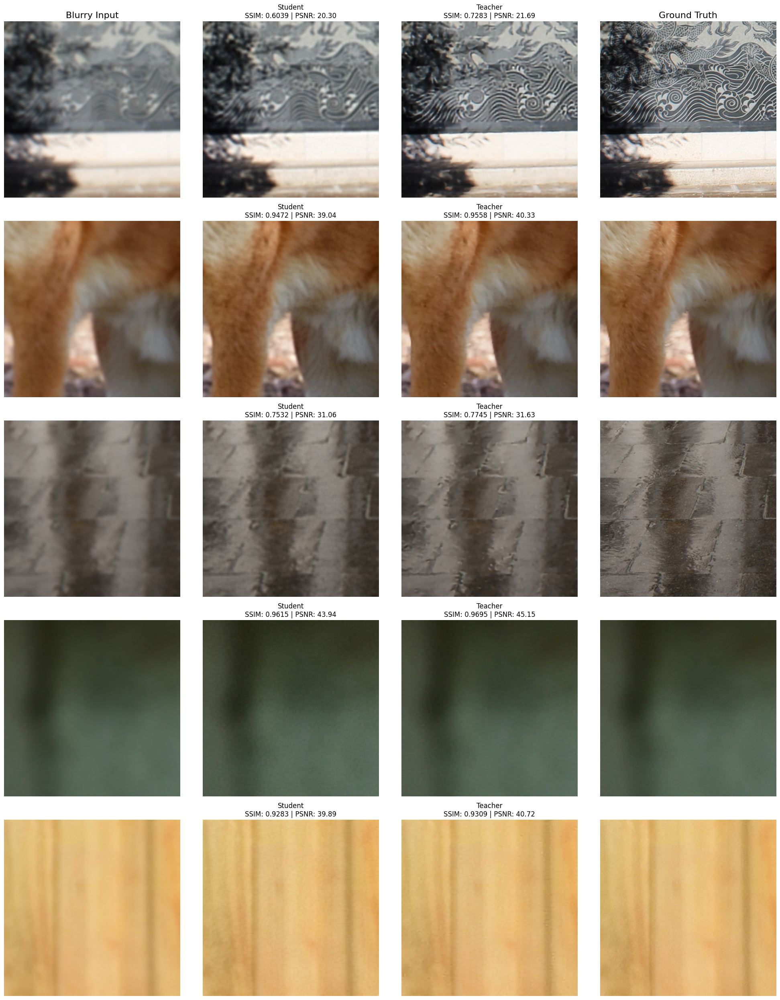

In [ ]:
from skimage.metrics import peak_signal_noise_ratio as psnr

def visualize_results_with_ssim_psnr(model, loader, num_images=25):
    """Displays a side-by-side comparison of input, output, ground truth along with SSIM & PSNR scores."""
    model.to(device)
    model.eval()
    to_pil = ToPILImage()

    teacher = TeacherModel()
    teacher.load_state_dict(torch.load("teacher_model.pth"))
    teacher.to(device)
    teacher.eval()

    fig, axes = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))
    if num_images == 1: axes = [axes]  # Make it iterable

    axes[0, 0].set_title("Blurry Input", fontsize=16)
    axes[0, 1].set_title("Student Output\n(SSIM | PSNR)", fontsize=16)
    axes[0, 2].set_title("Teacher Output\n(SSIM | PSNR)", fontsize=16)
    axes[0, 3].set_title("Ground Truth", fontsize=16)

    with torch.no_grad():
        for i, batch in enumerate(loader):
            if i >= num_images: break
            lr_img, hr_img = batch['lr'].to(device), batch['hr'].to(device)

            student_output = model(lr_img).clamp(0.0, 1.0)
            teacher_output = teacher(lr_img).clamp(0.0, 1.0)

            s_out_np = student_output.squeeze().cpu().numpy().transpose(1,2,0)
            t_out_np = teacher_output.squeeze().cpu().numpy().transpose(1,2,0)
            hr_np = hr_img.squeeze().cpu().numpy().transpose(1,2,0)

            #Compute SSIM & PSNR
            ssim_student = ssim(s_out_np, hr_np, data_range=1.0, channel_axis=2)
            ssim_teacher = ssim(t_out_np, hr_np, data_range=1.0, channel_axis=2)
            psnr_student = psnr(hr_np, s_out_np, data_range=1.0)
            psnr_teacher = psnr(hr_np, t_out_np, data_range=1.0)

            images = [
                to_pil(lr_img.squeeze().cpu()),
                to_pil(student_output.squeeze().cpu()),
                to_pil(teacher_output.squeeze().cpu()),
                to_pil(hr_img.squeeze().cpu())
            ]

            #Plot with annotations
            for j, (ax, img) in enumerate(zip(axes[i], images)):
                ax.imshow(img)
                ax.axis('off')
                if j == 1:
                    ax.set_title(f"Student\nSSIM: {ssim_student:.4f} | PSNR: {psnr_student:.2f}", fontsize=12)
                elif j == 2:
                    ax.set_title(f"Teacher\nSSIM: {ssim_teacher:.4f} | PSNR: {psnr_teacher:.2f}", fontsize=12)

    plt.tight_layout()
    plt.show()

print("\n Visualizing Sample Results with per-image SSIM & PSNR ")
visualize_results_with_ssim_psnr(final_student, test_loader, num_images=5)



Visualizing Random Sample Results with per-image SSIM & PSNR


C:\Users\FAHIM\AppData\Local\Temp\ipykernel_18912\3191209454.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  teacher.load_state_dict(torch.load("teacher_model.pth"))


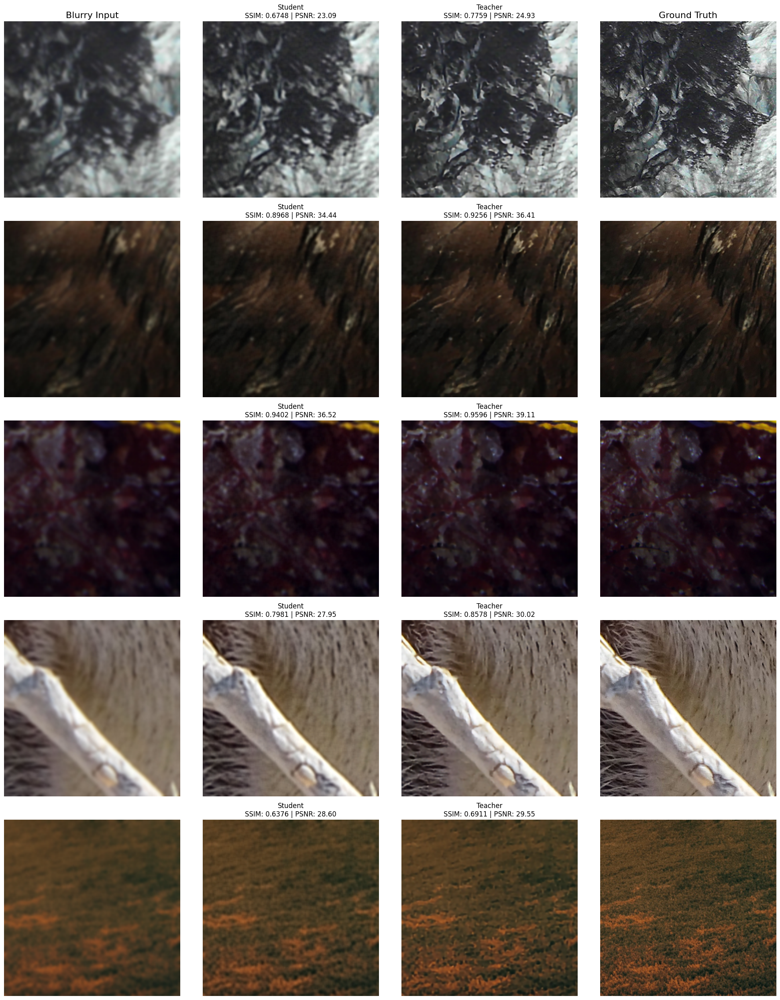

In [ ]:
from skimage.metrics import peak_signal_noise_ratio as psnr
import random

def visualize_results_with_ssim_psnr(model, loader, num_images=5):
    """Displays a random side-by-side comparison of input, output, ground truth along with SSIM & PSNR scores."""
    model.to(device)
    model.eval()
    to_pil = ToPILImage()

    teacher = TeacherModel()
    teacher.load_state_dict(torch.load("teacher_model.pth"))
    teacher.to(device)
    teacher.eval()

    # Convert loader to list and sample randomly
    data_list = list(loader)
    sampled_batches = random.sample(data_list, min(num_images, len(data_list)))

    fig, axes = plt.subplots(len(sampled_batches), 4, figsize=(20, 5 * len(sampled_batches)))
    if len(sampled_batches) == 1: axes = [axes]  # Make it iterable

    axes[0][0].set_title("Blurry Input", fontsize=16)
    axes[0][1].set_title("Student Output\n(SSIM | PSNR)", fontsize=16)
    axes[0][2].set_title("Teacher Output\n(SSIM | PSNR)", fontsize=16)
    axes[0][3].set_title("Ground Truth", fontsize=16)

    with torch.no_grad():
        for i, batch in enumerate(sampled_batches):
            lr_img, hr_img = batch['lr'].to(device), batch['hr'].to(device)

            student_output = model(lr_img).clamp(0.0, 1.0)
            teacher_output = teacher(lr_img).clamp(0.0, 1.0)

            s_out_np = student_output.squeeze().cpu().numpy().transpose(1,2,0)
            t_out_np = teacher_output.squeeze().cpu().numpy().transpose(1,2,0)
            hr_np = hr_img.squeeze().cpu().numpy().transpose(1,2,0)

            # Compute SSIM & PSNR
            ssim_student = ssim(s_out_np, hr_np, data_range=1.0, channel_axis=2)
            ssim_teacher = ssim(t_out_np, hr_np, data_range=1.0, channel_axis=2)
            psnr_student = psnr(hr_np, s_out_np, data_range=1.0)
            psnr_teacher = psnr(hr_np, t_out_np, data_range=1.0)

            images = [
                to_pil(lr_img.squeeze().cpu()),
                to_pil(student_output.squeeze().cpu()),
                to_pil(teacher_output.squeeze().cpu()),
                to_pil(hr_img.squeeze().cpu())
            ]

            # Plot with annotations
            for j, (ax, img) in enumerate(zip(axes[i], images)):
                ax.imshow(img)
                ax.axis('off')
                if j == 1:
                    ax.set_title(f"Student\nSSIM: {ssim_student:.4f} | PSNR: {psnr_student:.2f}", fontsize=12)
                elif j == 2:
                    ax.set_title(f"Teacher\nSSIM: {ssim_teacher:.4f} | PSNR: {psnr_teacher:.2f}", fontsize=12)

    plt.tight_layout()
    plt.show()

print("\nVisualizing Random Sample Results with per-image SSIM & PSNR")
visualize_results_with_ssim_psnr(final_student, test_loader, num_images=5)
